In [428]:
import numpy as np
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import skimage
import math

In [429]:
os.getcwd()
os.chdir(r'C:\Users\sherw\OneDrive\Desktop\CV_HW4\input')

In [430]:
plt.style.use(['dark_background'])
plt.rcParams['figure.figsize'] = (2*6.4,2*4.8)

# P1:

# Harris:

In [431]:
all_data = []
all_files = glob.glob(".\*.*")

imgs = []
imgs_rgb = []
imgs_temp = []
imgs_brisk = []
for filename in all_files:
    im = cv2.imread(filename)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY).astype(np.float32)
    img_brisk = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)
    imgs_brisk.append(img_brisk)
    imgs.append(img)
    imgs_rgb.append(im)
    imgs_temp.append(im)
    
ref = imgs[14]
test = imgs[0:14]
test = np.array(test)

In [281]:
# a.shape
# c = np.zeros(a.shape)
# c[b > 0.01 * b.max()] = 1

In [282]:
# param = [0.04,0.05,0.03,0.002,0.01,0.005,0.05,0.004,0.08,0.03,0.07,0.1,0.07,0.006,0.008]
# i = 14
# a =  cv2.cornerHarris(imgs[i], 3,3, 0.07)
# b = cv2.dilate(a,None)
# tmp = np.copy(imgs_temp[i])
# tmp[a > param[i] * a.max()]=[255, 0, 0]
# plt.imshow(tmp)

In [283]:
# # imgs_temp = np.copy(imgs_rgb)
# param = [0.04,0.05,0.03,0.002,0.01,0.005,0.05,0.004,0.08,0.03,0.07,0.1,0.07,0.006,0.008]
# plt.rcParams['figure.figsize'] = (4*6.4,4*4.8)
# for i in range(len(imgs)):
#     a =  cv2.cornerHarris(imgs[i], 3,3, 0.07)
#     b = cv2.dilate(a,None)
    
#     maxima_thresh = 0.09
#     centers = np.argwhere(a > param[i] * a.max())
    
#     tmp = np.copy(imgs_temp[i])
#     tmp[a > param[i] * a.max()]=[0, 0, 255]
    
#     for cen in centers:
#         cv2.circle(tmp, (tuple(cen)[1],tuple(cen)[0]), 3, (255, 0, 0), 1)
    
#     plt.subplot(1,2,1)
#     plt.imshow(imgs_rgb[i])
#     plt.axis('off')
#     plt.subplot(1,2,2)
#     plt.imshow(tmp)
#     plt.axis('off')
# #     plt.suptitle('Harris Corner',size = 50)
#     plt.show()
    

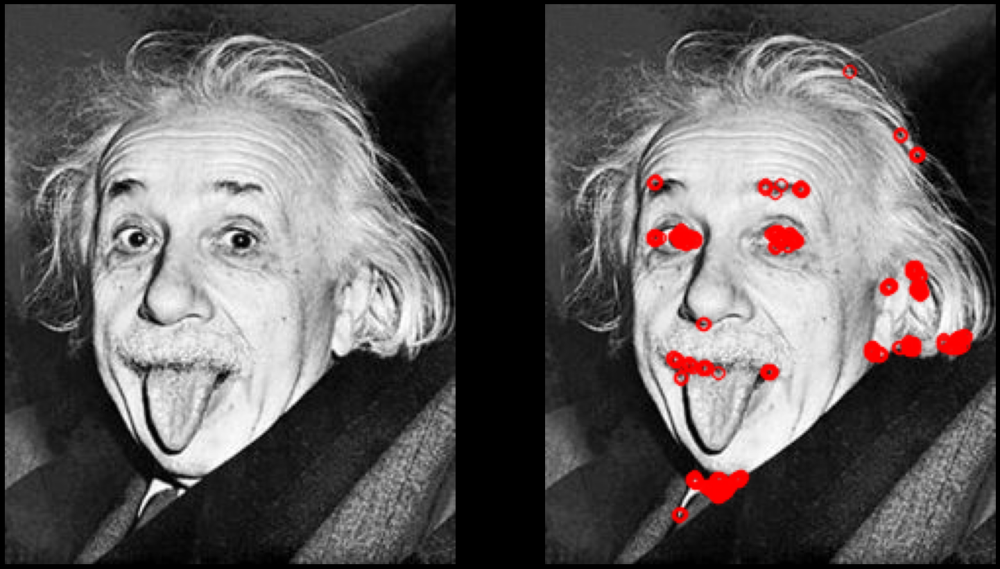

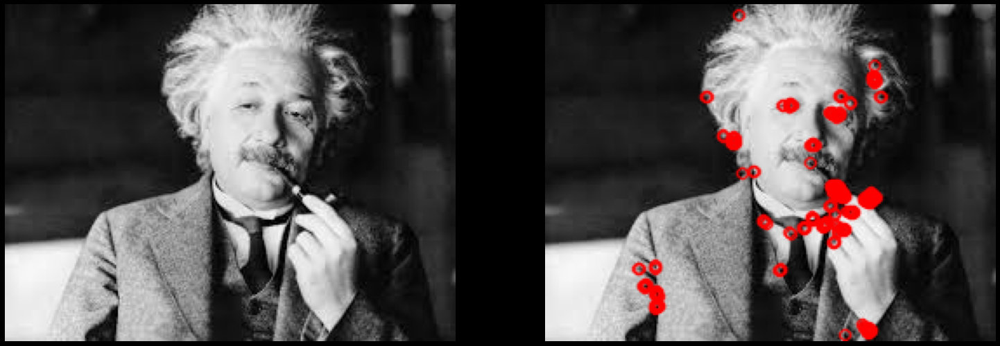

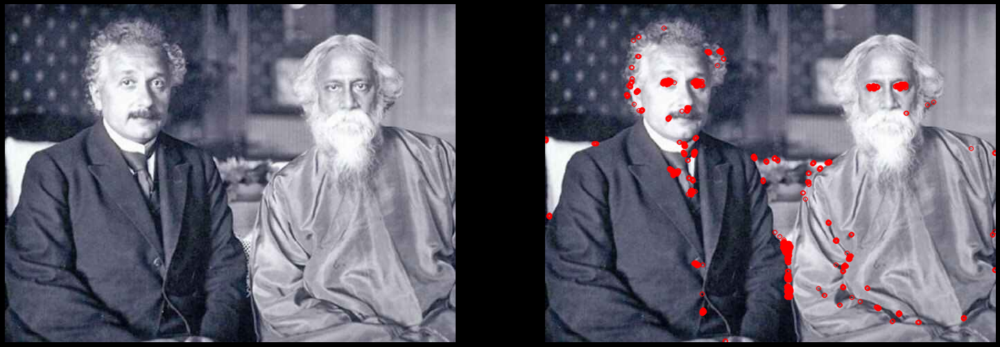

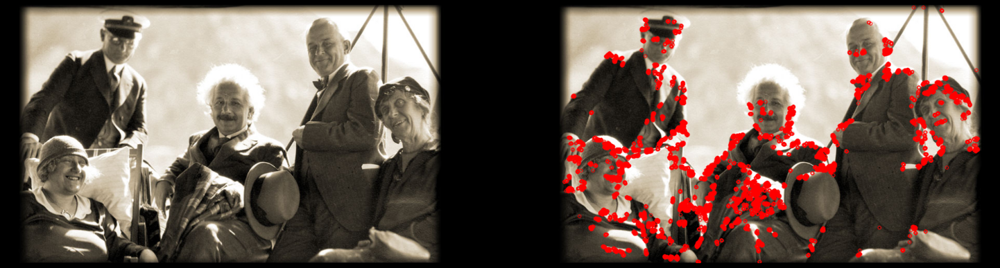

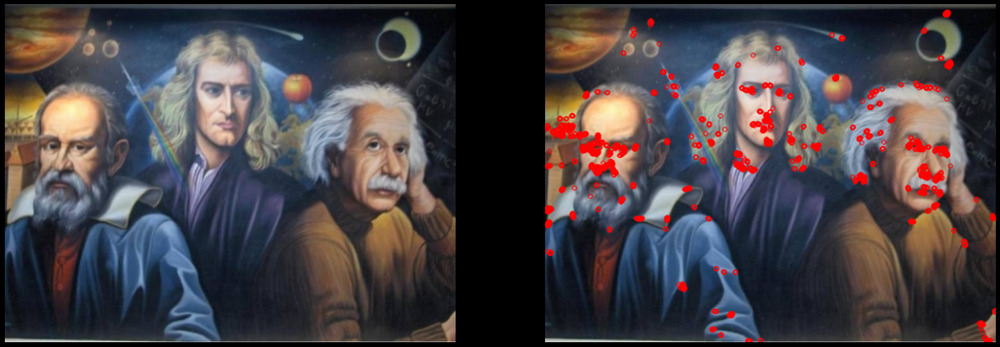

...

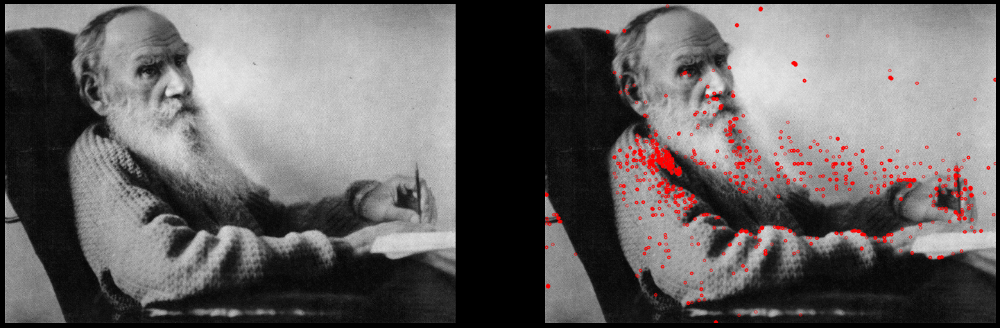

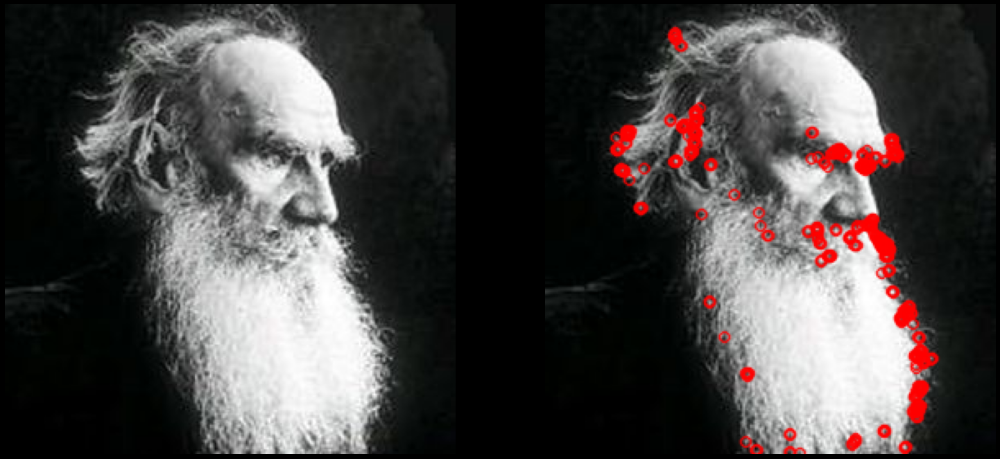

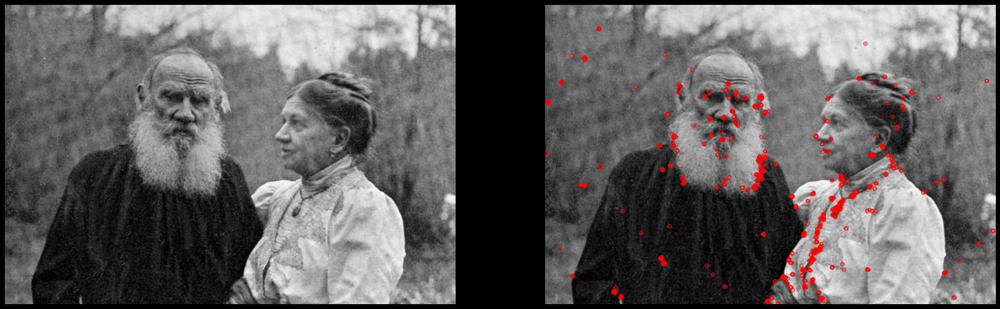

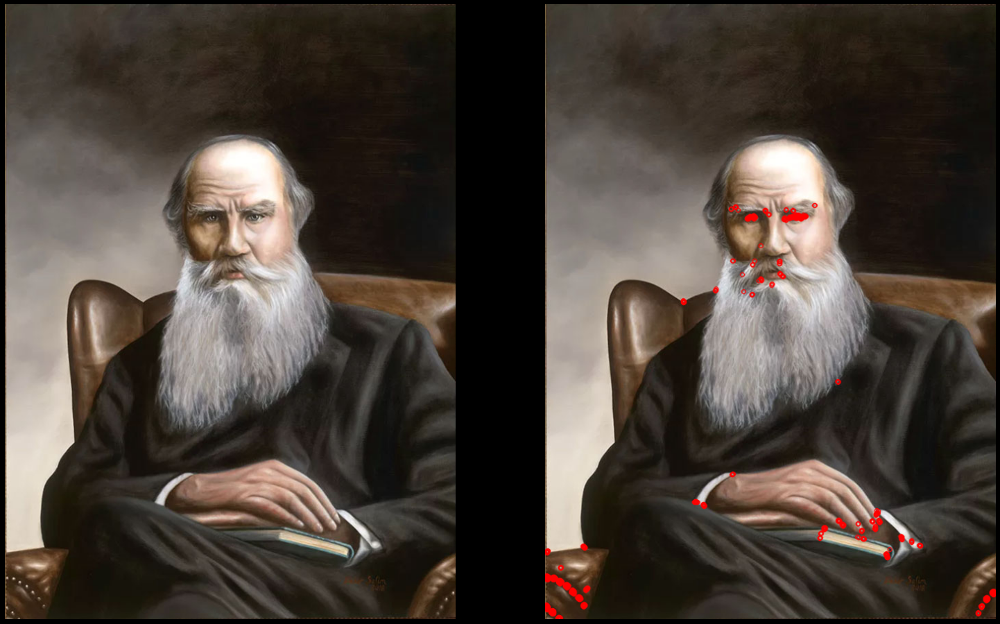

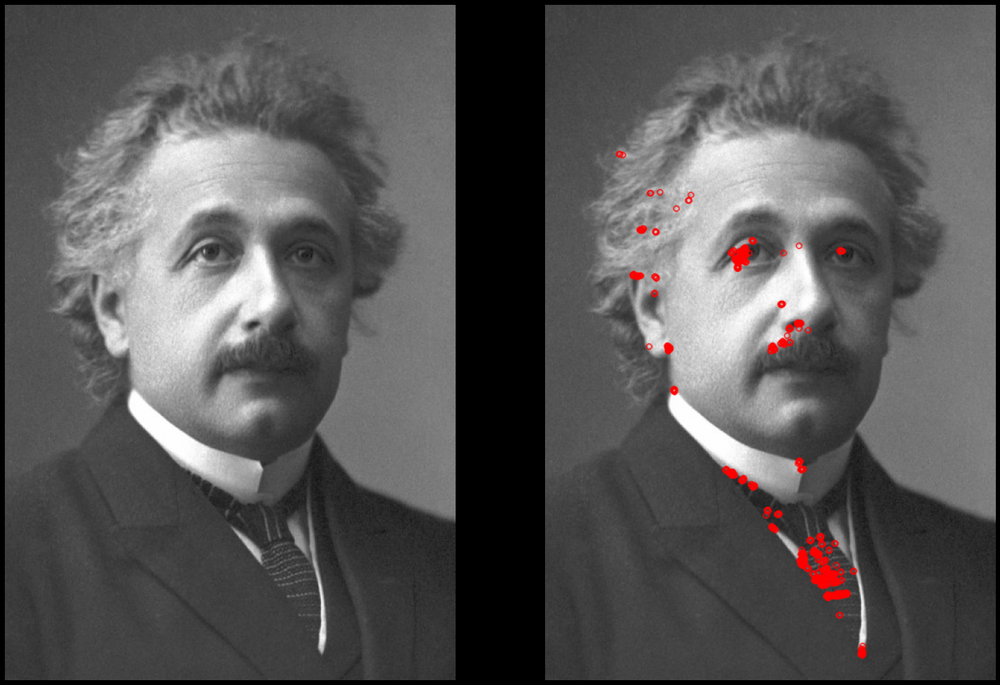

In [284]:
# imgs_temp = np.copy(imgs_rgb)
plt.rcParams['figure.figsize'] = (4*6.4,4*4.8)
param = [0.04,0.05,0.03,0.002,0.01,0.005,0.05,0.004,0.08,0.03,0.07,0.1,0.07,0.006,0.008]
kp_harris = []

for i in range(len(imgs_brisk)):
    a =  cv2.cornerHarris(imgs_brisk[i], 3, 3, 0.07)
    b = cv2.dilate(a,None)
    
    maxima_thresh = 0.05
    centers = np.argwhere(a > param[i] * a.max())
    
    tmp = np.copy(imgs_temp[i])
    tmp[a > param[i] * a.max()]=[0, 0, 255]
    
    keypoints = []
    for cen in centers:
        cen = cen.astype(np.float)
        c = cv2.KeyPoint(tuple(cen)[1],tuple(cen)[0],5)
        keypoints.append(c)
        kp_harris.append(c)
#         cv2.circle(tmp, (tuple(cen)[1],tuple(cen)[0]), 10, (255, 0, 0), 1)
    mg = cv2.drawKeypoints(imgs_rgb[i], keypoints, None,255)
    plt.subplot(1,2,1)
    plt.imshow(imgs_rgb[i])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(mg)
    plt.axis('off')
#     plt.suptitle('Harris Corner',size = 50)
    plt.show()
    

# BRISK:

In [432]:
plt.style.use(['dark_background'])
plt.rcParams['figure.figsize'] = (5,5)

In [541]:
param = np.array([70,80,40,30,20,40,30,50,80,60,75,70,45,40,30])
param = param - 30
# mean = np.mean(param)
# i = 8
# kp =cv2.BRISK_create(80).detect(imgs_brisk[i])
# mg=cv2.drawKeypoints(imgs_brisk[i], kp, None,255)
# plt.imshow(mg)

In [542]:
# imgs_temp = np.copy(imgs_rgb)
plt.rcParams['figure.figsize'] = (4*6.4,4*4.8)
kp_brisk = []

for i in range(len(imgs_brisk)):
    kp =cv2.BRISK_create(param[i]).detect(imgs_brisk[i])
    kp_brisk.append(kp)
    tmp = cv2.drawKeypoints(imgs_rgb[i], kp, None,255)

#     plt.subplot(1,2,1)
#     plt.imshow(imgs_rgb[i])
#     plt.axis('off')
#     plt.subplot(1,2,2)
#     plt.imshow(tmp)
#     plt.axis('off')
#     plt.show()

# P2:

In [543]:
freakExtractor = cv2.xfeatures2d.FREAK_create()
kp_ref,ref_des= freakExtractor.compute(imgs_brisk[14],kp_brisk[14])

In [544]:
kp = []
des = []

In [545]:
kp = []
des = []
for i in range(len(imgs)):
    kp_tmp, des_tmp = freakExtractor.compute(imgs_brisk[i],kp_brisk[i])
    kp.append(kp_tmp)
    des.append(des_tmp)

# P3:

In [546]:
plt.rcParams['figure.figsize'] = (9,9)

# KNN:

In [ ]:
# BFMatcher with default params
for i in range(len(imgs)):

    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(des[14],des[i], k=2)
    # matches = bf.match(des[14],des[i])

    # Apply ratio test
    good = []
    for m,n in matches:
        if m.distance<60 and m.distance < 0.5*n.distance:
            good.append([m])

    # for m in matches:
    #     if m.distance < 80:
    #         good.append([m])

    img3 = cv2.drawMatchesKnn(imgs[14].astype(np.uint8),kp[14],imgs[i].astype(np.uint8),kp[i],good,None,matchColor=(255, 0, 0), singlePointColor=(0, 0, 255),flags=2)

    plt.imshow(img3)
    plt.axis('off')
#     if :
#         plt.title()
    plt.title('{} key point matches'.format(len(good)))
    plt.show()

# CrossCheck:

In [536]:
# param = np.array([70,80,40,30,20,40,30,50,80,60,75,70,45,40,30])
# param = param + 10

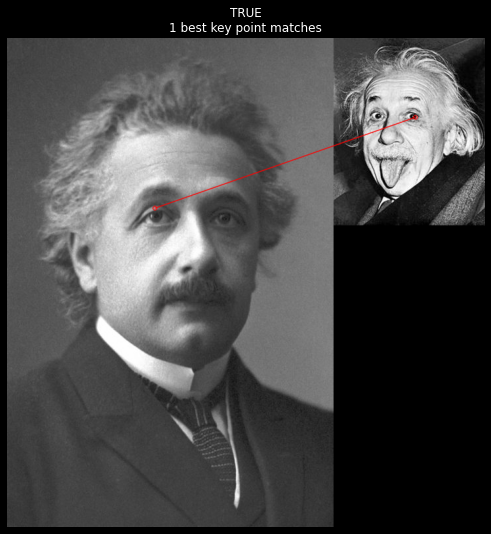

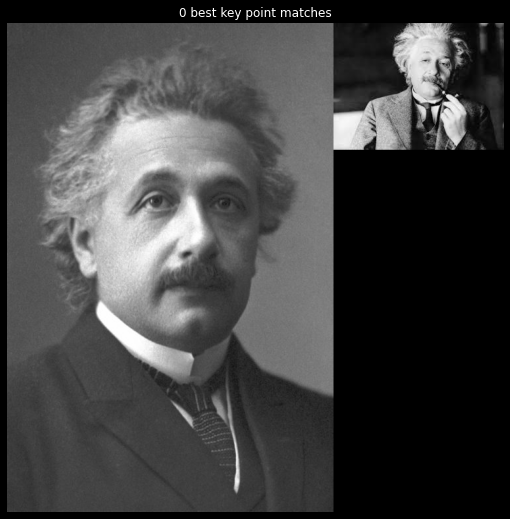

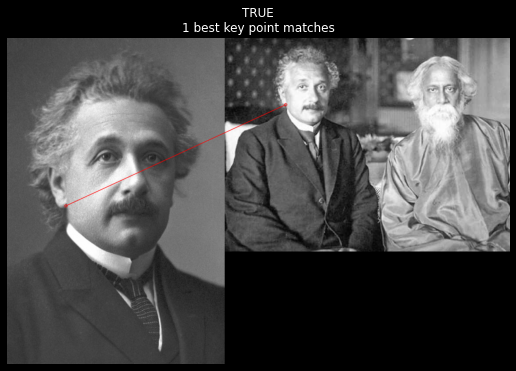

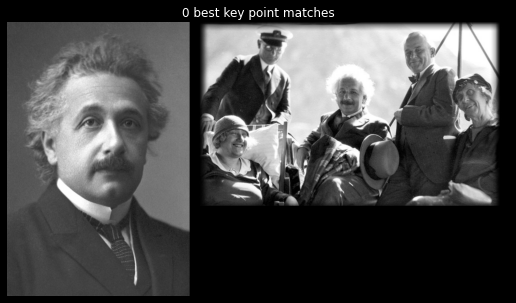

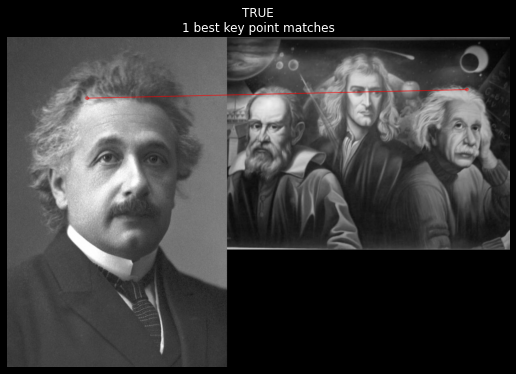

...

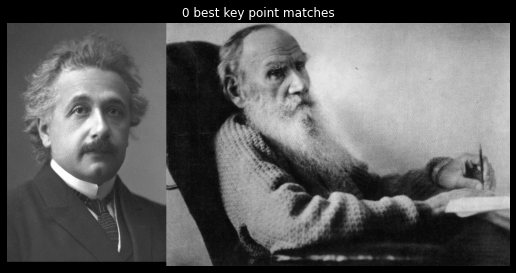

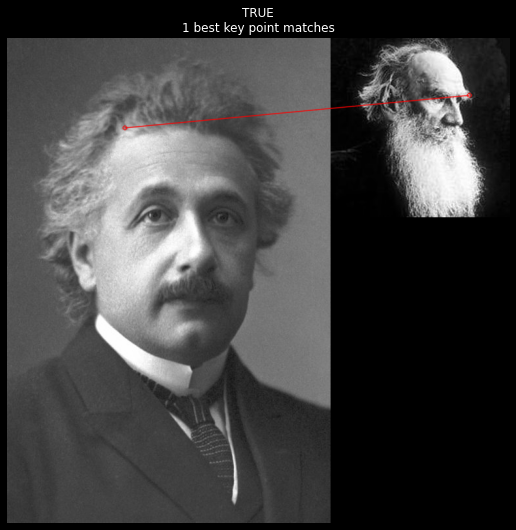

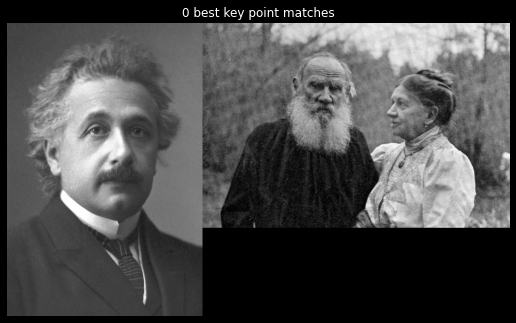

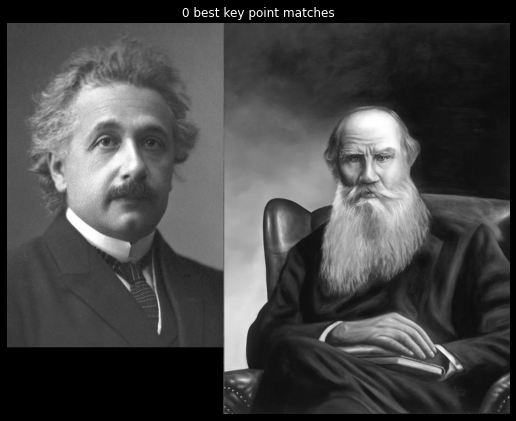

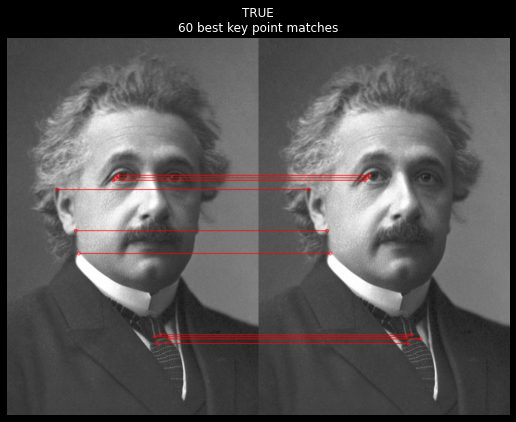

In [404]:
plt.rcParams['figure.figsize'] = (9,9)
for i in range(len(imgs)):
    bf = cv2.BFMatcher(cv2.NORM_HAMMING,crossCheck = False)

    matches = bf.match(des[14],des[i])
    matches = sorted(matches, key = lambda x:x.distance)

    good = []

    for m in matches:
        if m.distance < 70:
            good.append([m])
        
    img3 = cv2.drawMatchesKnn(imgs[14].astype(np.uint8),kp[14],imgs[i].astype(np.uint8),kp[i],good[0:10],None,matchColor=(255, 0, 0), singlePointColor=(0, 0, 255),flags=2)

    plt.imshow(img3)
    plt.axis('off')
    if len(good)>0:
        plt.title('TRUE\n{} best key point matches'.format(len(good)))
    else:
        plt.title('{} best key point matches'.format(len(good)))
    plt.show()